In [1]:
#loading libraries

import pandas as pd
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
import re
import nltk
from wordcloud import WordCloud
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, auc, roc_curve
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
sns.set_style("whitegrid")
plt.style.use("seaborn-deep")

In [2]:
df = pd.read_csv('ecommerce_data.csv')

In [3]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,channel
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom,Email
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,Email
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom,Email
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,Email
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom,Email


In [4]:
df.shape

(541909, 9)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
 8   channel      541909 non-null  object 
dtypes: float64(2), int64(1), object(6)
memory usage: 37.2+ MB


In [6]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


### DATA PRE-PROCESSING

In [7]:
#checking for missing values
df.isna().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
channel             0
dtype: int64

In [8]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
missing_value_df

,column_name,percent_missing
InvoiceNo,InvoiceNo,0.000000
StockCode,StockCode,0.000000
Description,Description,0.268311
Quantity,Quantity,0.000000
InvoiceDate,InvoiceDate,0.000000
UnitPrice,UnitPrice,0.000000
CustomerID,CustomerID,24.926694
Country,Country,0.000000
channel,channel,0.000000


From the above information we can infer that CustomerID have almost 25% missing values in the dataset. With the given dataset it is not possible to impute the missing values with any of the method and it turns out be useless for our analysis hence, we can drop those observations.

In [9]:
df.dropna(axis = 0, subset = ['CustomerID'], inplace = True)
df.shape

(406829, 9)

In [10]:
percent_missing = df.isnull().sum() * 100 / len(df)
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})
missing_value_df

,column_name,percent_missing
InvoiceNo,InvoiceNo,0.0
StockCode,StockCode,0.0
Description,Description,0.0
Quantity,Quantity,0.0
InvoiceDate,InvoiceDate,0.0
UnitPrice,UnitPrice,0.0
CustomerID,CustomerID,0.0
Country,Country,0.0
channel,channel,0.0


From the above information we can see that all the null values have been removed. And now, we can begin our analyis. 
Firstly, we will look into the duplicate values present in our dataet.

In [11]:
#checking for duplicate records
df.duplicated().sum()

5225

In [12]:
#Remove the duplicate values
df.drop_duplicates(inplace=True)
df.duplicated().sum()

0

In [13]:
#changing the data typr of few columns
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['CustomerID'] = df['CustomerID'].astype('int64')

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 401604 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    401604 non-null  object        
 1   StockCode    401604 non-null  object        
 2   Description  401604 non-null  object        
 3   Quantity     401604 non-null  int64         
 4   InvoiceDate  401604 non-null  datetime64[ns]
 5   UnitPrice    401604 non-null  float64       
 6   CustomerID   401604 non-null  int64         
 7   Country      401604 non-null  object        
 8   channel      401604 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(2), object(5)
memory usage: 30.6+ MB


In [15]:
df['Quantity'].unique()

array([     6,      8,      2,     32,      3,      4,     24,     12,
           48,     18,     20,     36,     80,     64,     10,    120,
           96,     23,      5,      1,     -1,     50,     40,    100,
          192,    432,    144,    288,    -12,    -24,     16,      9,
          128,     25,     30,     28,      7,     72,    200,    600,
          480,     -6,     14,     -2,     -4,     -5,     -7,     -3,
           11,     70,    252,     60,    216,    384,     27,    108,
           52,  -9360,     75,    270,     42,    240,     90,    320,
           17,   1824,    204,     69,    -36,   -192,   -144,    160,
         2880,   1400,     19,     39,    -48,    -50,     56,     13,
         1440,     -8,     15,    720,    -20,    156,    324,     41,
          -10,    -72,    -11,    402,    378,    150,    300,     22,
           34,    408,    972,    208,   1008,     26,   1000,    -25,
         1488,    250,   1394,    400,    110,    -14,     37,    -33,
      

As we can see that Quantity column in our dataset consist of negative values too. And we know that quantity can never be measured in negative. Also, there only 130+ negative values and our dataset have 40,000+ observations which is not even 1% of total observations hence, we can drop those negative values.

In [16]:
#Removing the negative values from the Quantity column
df = df[df.Quantity > 0]

##### We can add an extra column which will show the total amount spent by each cutomer.

In [17]:
df['Total_Price'] = df['Quantity'] * df['UnitPrice']
df.head(3)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,channel,Total_Price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,Email,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,Email,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,Email,22.00


##### Dividing the InvoiceDate column into year,month,day and hour

In [18]:
df.insert(loc=5, column='year_month', value=df['InvoiceDate'].map(lambda x: 100*x.year + x.month))
df.insert(loc=6, column='Month', value=df.InvoiceDate.dt.month)

df.insert(loc=7, column='Day', value=(df.InvoiceDate.dt.dayofweek)+1)
df.insert(loc=8, column='Hour', value=df.InvoiceDate.dt.hour)
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,year_month,Month,Day,Hour,UnitPrice,CustomerID,Country,channel,Total_Price
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,201012,12,3,8,2.55,17850,United Kingdom,Email,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,201012,12,3,8,3.39,17850,United Kingdom,Email,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,201012,12,3,8,2.75,17850,United Kingdom,Email,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,201012,12,3,8,3.39,17850,United Kingdom,Email,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,201012,12,3,8,3.39,17850,United Kingdom,Email,20.34


## EXPLORATORY DATA ANALYSIS

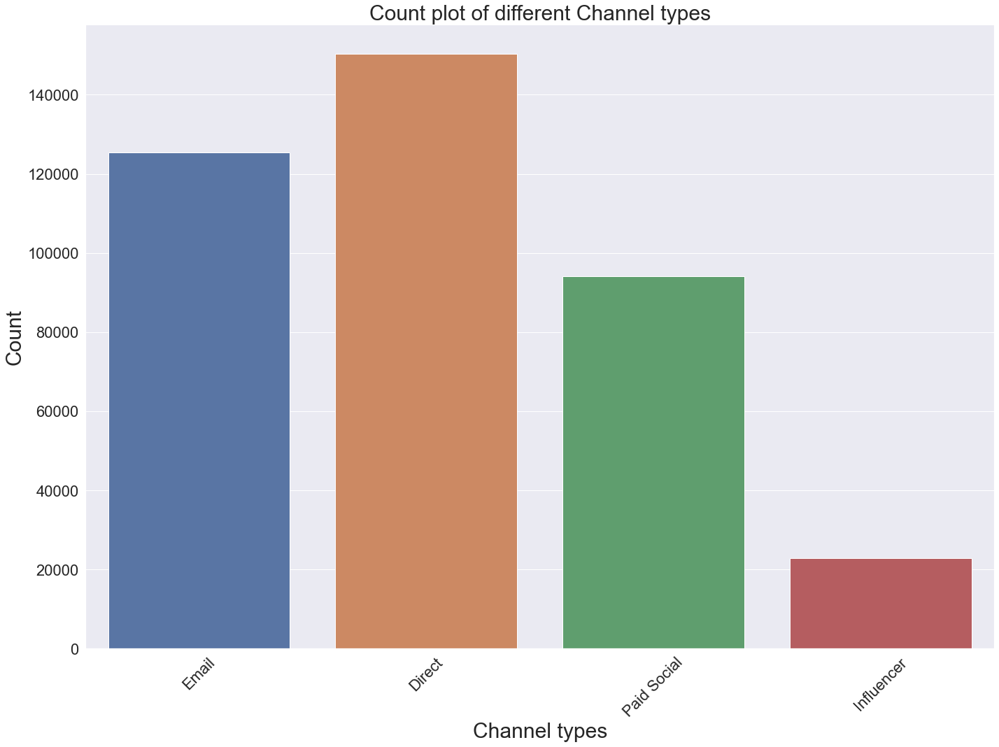

In [19]:
plt.figure(figsize=(20,15))
sns.set(font_scale=2)
sns.countplot(x='channel',data=df)
sns.set(style="darkgrid")
plt.xlabel('Channel types',fontsize=30)
plt.ylabel('Count',fontsize=30)
plt.xticks(rotation='45')
plt.title('Count plot of different Channel types',fontsize=30)
plt.tight_layout()

From the above graph we can see that the most common or used channel type is Email followed by Direct, Paid Social and Influencer

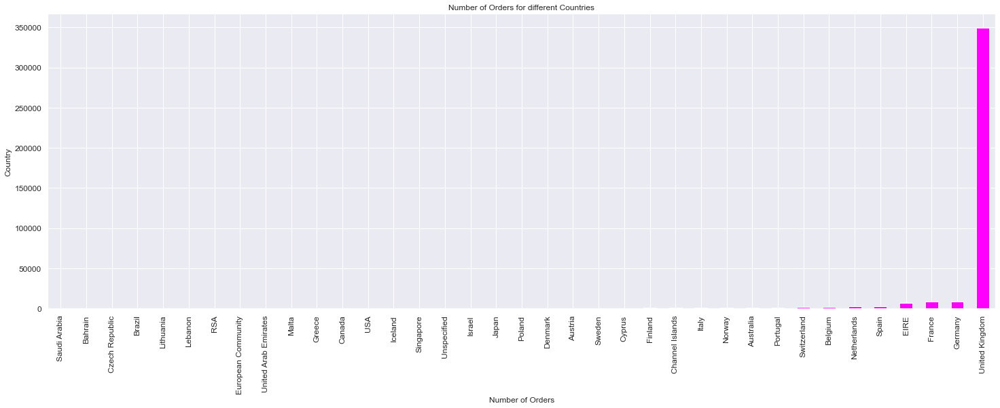

In [20]:
#Grouping the orders by country
country_orders = df.groupby('Country')['InvoiceNo'].count().sort_values()

plt.subplots(figsize=(25,8))
country_orders.plot(kind='bar', fontsize=12, color='magenta')
plt.xlabel('Number of Orders', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation='90')
plt.title('Number of Orders for different Countries', fontsize=12)
plt.show()

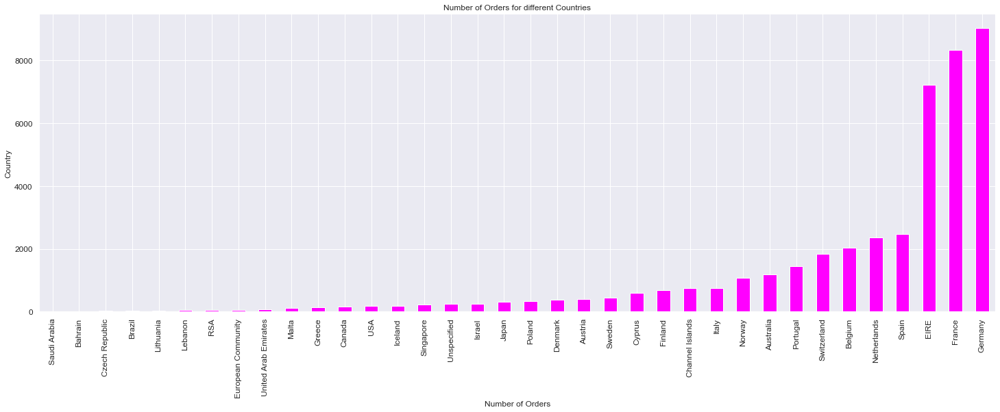

In [21]:
country_orders = df.groupby('Country')['InvoiceNo'].count().sort_values()
del country_orders['United Kingdom']
plt.subplots(figsize=(25,8))
country_orders.plot(kind='bar', fontsize=12, color='magenta')
plt.xlabel('Number of Orders', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation='90')
plt.title('Number of Orders for different Countries', fontsize=12)
plt.show()


- Now we can see that United Kingdom has the most number of order among all the countries followed by germany France.
- And the countries with least transaction is Lebanon, RSA, Saudi Arabia and Brazil with only one trandaction

### Now we will look into the purchases made by customers by month, days and hour

In [22]:
df.year_month.unique()

array([201012, 201101, 201102, 201103, 201104, 201105, 201106, 201107,
       201108, 201109, 201110, 201111, 201112], dtype=int64)

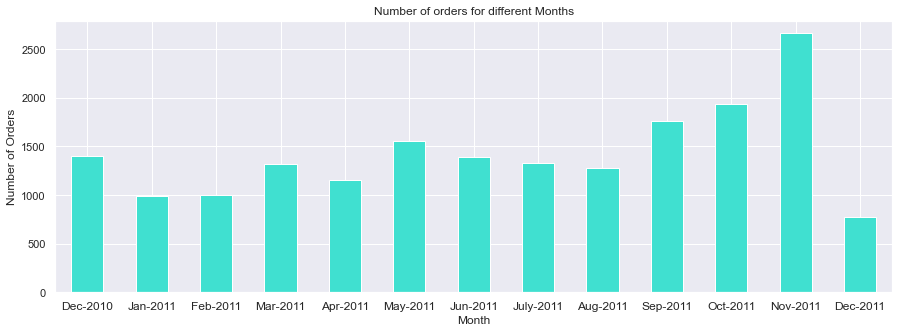

In [23]:
ax = df.groupby('InvoiceNo')['year_month'].unique().value_counts().sort_index().plot(kind='bar',figsize=(15,5),color='turquoise')
ax.set_xlabel('Month',fontsize=12)
ax.set_ylabel('Number of Orders',fontsize=12)
ax.set_title('Number of orders for different Months',fontsize=12)
ax.set_xticklabels(('Dec-2010','Jan-2011','Feb-2011','Mar-2011','Apr-2011','May-2011','Jun-2011','July-2011','Aug-2011','Sep-2011','Oct-2011','Nov-2011','Dec-2011'), rotation='horizontal', fontsize=12)
plt.show()

- November turned out to be the month with most of the orders
- Also, we can see a huge drop from November 2011 to December 2011.

In [24]:
df.Day.unique()

array([3, 4, 5, 7, 1, 2], dtype=int64)

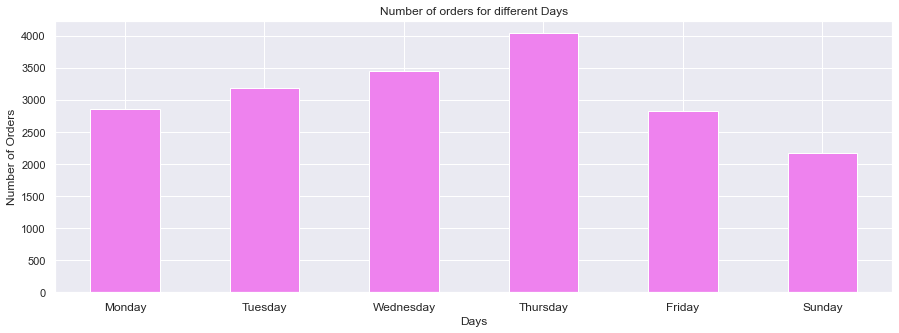

In [25]:
ax = df.groupby('InvoiceNo')['Day'].unique().value_counts().sort_index().plot(kind='bar',figsize=(15,5),color='violet')
ax.set_xlabel('Days',fontsize=12)
ax.set_ylabel('Number of Orders',fontsize=12)
ax.set_title('Number of orders for different Days',fontsize=12)
ax.set_xticklabels(('Monday','Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Sunday'), rotation='horizontal',fontsize=12)
plt.show()

- Most of the orders were placed on Thursdays by customers.
- Also, we can see that there is not even a single purchase made by the customers on saturday.

In [26]:
df.Hour.unique()

array([ 8,  9, 10, 11, 12, 13, 14, 15, 16, 17,  7, 18, 19, 20,  6],
      dtype=int64)

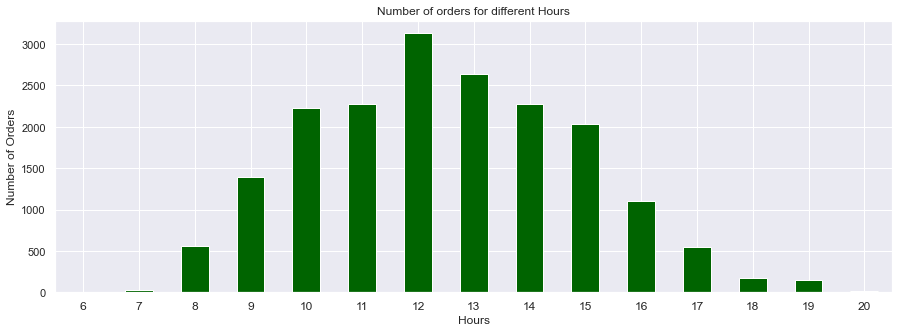

In [27]:
ax = df.groupby('InvoiceNo')['Hour'].unique().value_counts().iloc[:-1].sort_index().plot(kind='bar',figsize=(15,5),color='darkgreen')
ax.set_xlabel('Hours',fontsize=12)
ax.set_ylabel('Number of Orders',fontsize=12)
ax.set_title('Number of orders for different Hours',fontsize=12)
ax.set_xticklabels(range(6,21), rotation='horizontal', fontsize=12)
plt.show()

- At the 12 hour most of the orders were made by the customers
- And the window is from 10-15 hours when mostly customers used to make order.

### Now we will look for the Unit price and Total Amount spent by the customers coulmm

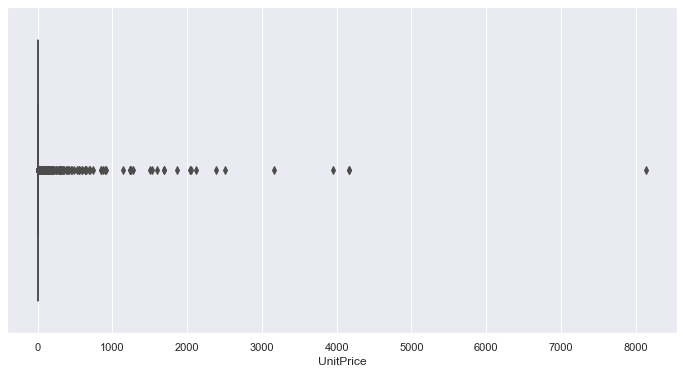

In [28]:
plt.subplots(figsize=(12,6))
sns.boxplot(df.UnitPrice)
plt.show()

- Here we can see that some of the orders made by the customers have unit price zero which migth say that there were some products with discount 
- Also, we can see some few outliers

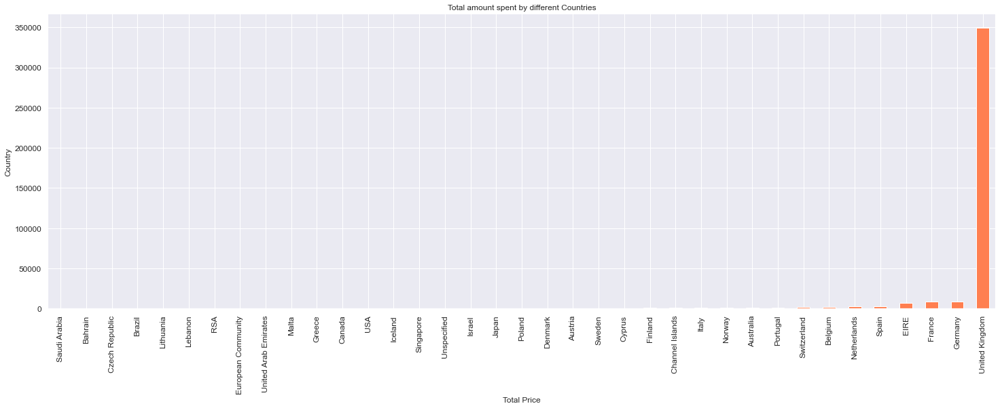

In [29]:
country_amount = df.groupby('Country')['Total_Price'].count().sort_values()

plt.subplots(figsize=(25,8))
country_amount.plot(kind='bar', fontsize=12, color='coral')
plt.xlabel('Total Price', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation='90')
plt.title('Total amount spent by different Countries', fontsize=12)
plt.show()

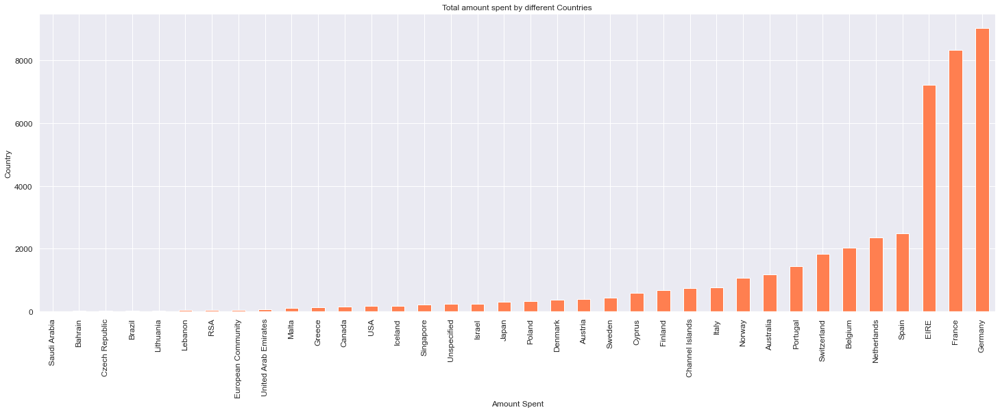

In [30]:
country_amount = df.groupby('Country')['Total_Price'].count().sort_values()
del country_amount['United Kingdom']
plt.subplots(figsize=(25,8))
country_amount.plot(kind='bar', fontsize=12, color='coral')
plt.xlabel('Amount Spent', fontsize=12)
plt.ylabel('Country', fontsize=12)
plt.xticks(rotation='90')
plt.title('Total amount spent by different Countries', fontsize=12)
plt.show()

- As we know the most orders were made by United Kingdom hence, the most amount spend by is from United Kingdom only.

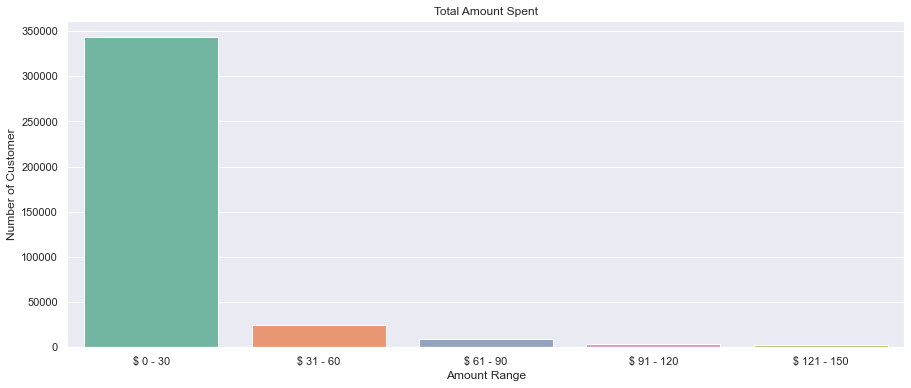

In [31]:
ai0_30 = df["Total_Price"][(df["Total_Price"] >= 0) & (df["Total_Price"] <= 30)]
ai31_60 = df["Total_Price"][(df["Total_Price"] >= 31) & (df["Total_Price"] <= 60)]
ai61_90 = df["Total_Price"][(df["Total_Price"] >= 61) & (df["Total_Price"] <= 90)]
ai91_120 = df["Total_Price"][(df["Total_Price"] >= 91) & (df["Total_Price"] <= 120)]
ai121_150 = df["Total_Price"][(df["Total_Price"] >= 121) & (df["Total_Price"] <= 150)]

aix = ["$ 0 - 30", "$ 31 - 60", "$ 61 - 90", "$ 91 - 120", "$ 121 - 150"]
aiy = [len(ai0_30.values), len(ai31_60.values), len(ai61_90.values), len(ai91_120.values), len(ai121_150.values)]

plt.figure(figsize=(15,6))
sns.barplot(x=aix, y=aiy, palette="Set2")
plt.title("Total Amount Spent")
plt.xlabel("Amount Range")
plt.ylabel("Number of Customer")
plt.show()

### Now we look into Decription column

In [32]:
from collections import Counter
results = Counter()
df["Description"].str.split(' ').apply(results.update)
print(results)

Counter({'': 100935, 'OF': 40191, 'SET': 40160, 'BAG': 37414, 'RED': 31481, 'HEART': 28586, 'RETROSPOT': 26063, 'VINTAGE': 25300, 'DESIGN': 23180, 'PINK': 19888, 'CHRISTMAS': 18808, 'BOX': 17547, 'CAKE': 15867, 'WHITE': 15759, 'METAL': 15532, 'JUMBO': 15333, 'LUNCH': 14709, '3': 14252, 'BLUE': 13640, 'HANGING': 12646, 'SIGN': 12548, 'HOLDER': 12435, 'PACK': 11841, 'T-LIGHT': 11048, 'PAPER': 10622, 'SMALL': 10210, 'WOODEN': 9918, '6': 9517, 'CARD': 9402, 'CASES': 9369, '12': 8753, 'POLKADOT': 8707, 'TEA': 8647, 'DECORATION': 8531, 'BOTTLE': 8480, 'SPACEBOY': 8463, 'GLASS': 8425, 'IN': 8313, 'HOT': 7792, 'HOME': 7741, 'AND': 7665, 'WATER': 7431, 'PANTRY': 7413, 'TIN': 7333, 'LARGE': 7326, 'WITH': 6795, 'DOORMAT': 6741, 'CERAMIC': 6700, 'REGENCY': 6696, '4': 6657, 'PAISLEY': 6541, 'DOLLY': 6480, 'IVORY': 6425, 'CREAM': 6297, 'BUNTING': 6233, 'WRAP': 6170, 'FELTCRAFT': 6124, 'ROSE': 6097, 'GREEN': 6060, 'GIRL': 6020, 'MUG': 5994, 'ASSORTED': 5951, 'MINI': 5903, 'CLOCK': 5800, 'LOVE': 5770,

In [33]:
#Removes white spaces
df['Description']=df['Description'].str.strip()

#Remove the stopwords
# download the stopwords dictionary
from nltk.corpus import stopwords
nltk.download('stopwords')

# save the list of stopwords in stop_words
stop_words = set(stopwords.words("english"))
# add extra words to the stopwords dictionary
new_stopwords = ['use', 'get', 'make', 'go', 'see']
new_stopwords_list = stop_words.union(new_stopwords) 

# remove the words that exist in the stopwords dictionary from tweets
df["content_no_stop_words"] = df["Description"].apply(lambda words: ' '.join(word.lower() for word in words.split() if word not in new_stopwords_list))
df.head(2)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SHAILEY\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,year_month,Month,Day,Hour,UnitPrice,CustomerID,Country,channel,Total_Price,content_no_stop_words
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,201012,12,3,8,2.55,17850,United Kingdom,Email,15.30,white hanging heart t-light holder
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,201012,12,3,8,3.39,17850,United Kingdom,Email,20.34,white metal lantern


In [34]:
from collections import Counter
results = Counter()
df["content_no_stop_words"].str.split(' ').apply(results.update)
print(results)

Counter({'of': 40191, 'set': 40160, 'bag': 37414, 'red': 31481, 'heart': 28586, 'retrospot': 26063, 'vintage': 25300, 'design': 23180, 'pink': 19888, 'christmas': 18808, 'box': 17547, 'cake': 15867, 'white': 15759, 'metal': 15532, 'jumbo': 15333, 'lunch': 14709, '3': 14252, 'blue': 13643, 'hanging': 12646, 'sign': 12548, 'holder': 12435, 'pack': 11841, 't-light': 11048, 'paper': 10622, 'small': 10210, 'wooden': 9918, '6': 9517, 'card': 9402, 'cases': 9369, '12': 8753, 'polkadot': 8707, 'tea': 8647, 'decoration': 8531, 'bottle': 8480, 'spaceboy': 8463, 'glass': 8425, 'in': 8313, 'hot': 7792, 'home': 7741, 'and': 7665, 'water': 7431, 'pantry': 7413, 'tin': 7333, 'large': 7326, 'with': 6795, 'doormat': 6741, 'ceramic': 6700, 'regency': 6696, '4': 6657, 'paisley': 6541, 'dolly': 6480, 'ivory': 6425, 'cream': 6297, 'bunting': 6233, 'wrap': 6170, 'feltcraft': 6124, 'rose': 6097, 'green': 6060, 'girl': 6020, 'mug': 5994, 'assorted': 5951, 'mini': 5903, 'clock': 5800, 'love': 5770, 'party': 57

In [35]:
text_wc = " ".join(item for item in df["content_no_stop_words"])
text_wc

'white hanging heart t-light holder white metal lantern cream cupid hearts coat hanger knitted union flag hot water bottle red woolly hottie white heart. set 7 babushka nesting boxes glass star frosted t-light holder hand warmer union jack hand warmer red polka dot assorted colour bird ornament poppy\'s playhouse bedroom poppy\'s playhouse kitchen feltcraft princess charlotte doll ivory knitted mug cosy box of 6 assorted colour teaspoons box of vintage jigsaw blocks box of vintage alphabet blocks home building block word love building block word recipe box with metal heart doormat new england jam making set with jars red coat rack paris fashion yellow coat rack paris fashion blue coat rack paris fashion bath building block word alarm clock bakelike pink alarm clock bakelike red alarm clock bakelike green panda and bunnies sticker sheet stars gift tape inflatable political globe vintage heads and tails card game set/2 red retrospot tea towels round snack boxes set of4 woodland spaceboy 

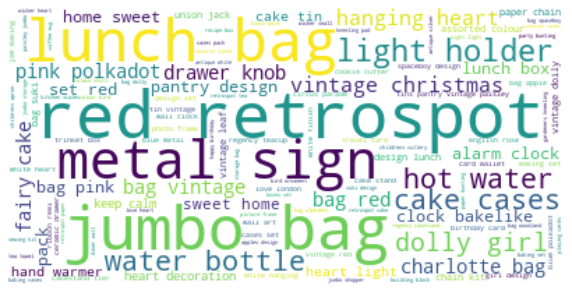

In [36]:
# create the wordcloud object; we will use this object to plot the words in the wordcloud
wordcloud = WordCloud(background_color="white").generate(text_wc)
plt.figure(figsize = (10, 10))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show() 

From the above word cloud we can infer that most the words highlighted are 'jumbo', 'bag', 'lunch. 'red' 'retrospot' and so on.
Also, we can say that the product which was ordered most was bag.

###  <font color='hotpink'> **CUSTOMER SEGMENTATION**

### RMF Modeling

As we know our dataset do not have much detailed information about the customers so here we can use RMF- Recency, Frequency, Monetory value model to find our customer segments.

In [37]:
# Create date variable that records recency
import datetime
date = max(df.InvoiceDate) + datetime.timedelta(days=1)


rfm = df.groupby(['CustomerID']).agg({'InvoiceDate': lambda x: (date - x.max()).days,
                                              'InvoiceNo': 'count',
                                              'Total_Price': 'sum'})
rfm.reset_index(inplace=True)
# Renaming the columns
rfm.rename(columns = {'InvoiceDate': 'Recency',
                            'InvoiceNo': 'Frequency',
                            'Total_Price': 'MonetaryValue'}, inplace=True)
rfm.head()

,CustomerID,Recency,Frequency,MonetaryValue
0,12346,326,1,77183.60
1,12347,2,182,4310.00
2,12348,75,31,1797.24
3,12349,19,73,1757.55
4,12350,310,17,334.40


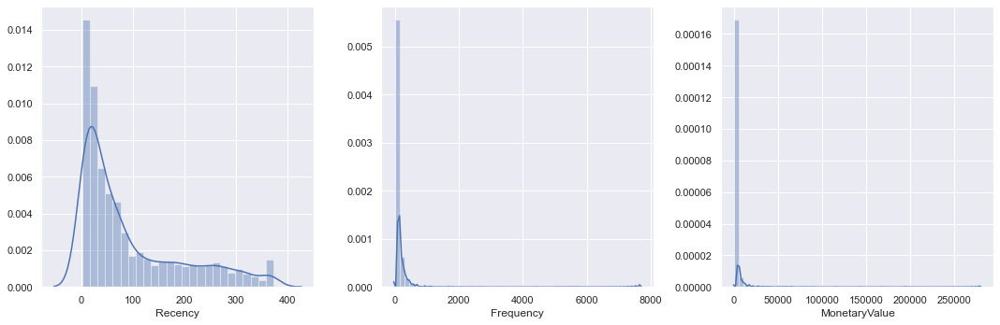

In [38]:

fig, ax = plt.subplots(1, 3, figsize=(15,5))
sns.distplot(rfm['Recency'], ax=ax[0])
sns.distplot(rfm['Frequency'], ax=ax[1])
sns.distplot(rfm['MonetaryValue'], ax=ax[2])
plt.tight_layout()
plt.show()

In [39]:
# Splitting the RFM into 4 quantiles
quantiles = rfm.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()

In [40]:
#Now we will create segments each for R, F and M individually

def r_score(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def fnm_score(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [41]:
#Calculate Add R, F and M segment value columns in the existing dataset 
rfm['R'] = rfm['Recency'].apply(r_score, args=('Recency',quantiles,))
rfm['F'] = rfm['Frequency'].apply(fnm_score, args=('Frequency',quantiles,))
rfm['M'] = rfm['MonetaryValue'].apply(fnm_score, args=('MonetaryValue',quantiles,))
rfm.head()

,CustomerID,Recency,Frequency,MonetaryValue,R,F,M
0,12346,326,1,77183.60,4,4,1
1,12347,2,182,4310.00,1,1,1
2,12348,75,31,1797.24,3,3,1
3,12349,19,73,1757.55,2,2,1
4,12350,310,17,334.40,4,4,3


In [42]:
#Now we will add the R, F, M score
rfm['rfm_group'] = rfm.R.map(str) + rfm.F.map(str) + rfm.M.map(str)

#Add rfm group values to get RFM score
rfm['rfm_score'] = rfm[['R', 'F', 'M']].sum(axis = 1)
rfm.head()

,CustomerID,Recency,Frequency,MonetaryValue,R,F,M,rfm_group,rfm_score
0,12346,326,1,77183.60,4,4,1,441,9
1,12347,2,182,4310.00,1,1,1,111,3
2,12348,75,31,1797.24,3,3,1,331,7
3,12349,19,73,1757.55,2,2,1,221,5
4,12350,310,17,334.40,4,4,3,443,11


In [43]:
#Assign Loyalty Level to each customer
Loyalty_Level = ['Platinum', 'Gold', 'Silver', 'Bronze']
Score_cuts = pd.qcut(rfm.rfm_score, q = 4, labels = Loyalty_Level)
rfm['RFM_Loyalty_Level'] = Score_cuts.values
rfm.reset_index().head()

,index,CustomerID,Recency,Frequency,MonetaryValue,R,F,M,rfm_group,rfm_score,RFM_Loyalty_Level
0,0,12346,326,1,77183.60,4,4,1,441,9,Silver
1,1,12347,2,182,4310.00,1,1,1,111,3,Platinum
2,2,12348,75,31,1797.24,3,3,1,331,7,Gold
3,3,12349,19,73,1757.55,2,2,1,221,5,Platinum
4,4,12350,310,17,334.40,4,4,3,443,11,Bronze


In [44]:
import chart_studio as cs
import plotly.offline as po
import plotly.graph_objs as gobj

#Recency Vs Frequency
graph = rfm.query("MonetaryValue < 50000 and Frequency < 2000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]

plot_layout = gobj.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)



In [45]:

#Frequency Vs Monetary
graph = rfm.query("MonetaryValue < 50000 and Frequency < 2000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]

plot_layout = gobj.Layout(
        yaxis= {'title': "MonetaryValue"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)


In [46]:

#Recency Vs Monetary
graph = rfm.query("MonetaryValue < 50000 and Frequency < 2000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]

plot_layout = gobj.Layout(
        yaxis= {'title': "MonetaryValue"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)


## K-Means Clustering

As, we saw in the above Recency, Frequency, and MonetaryValue graphs that they were not normally distributed. They were left skewed. And, we need to make them normal so we need to perform log transformation

In [47]:
#we need to handle any negative or zero values in recency and monetaryvalue columns
def handle_neg_n_zero(num):
    if num <= 0:
        return 1
    else:
        return num
#Apply function to Recency and Monetary columns 
rfm['Recency'] = [handle_neg_n_zero(x) for x in rfm.Recency]
rfm['MonetaryValue'] = [handle_neg_n_zero(x) for x in rfm.MonetaryValue]

#Log transformation
Log_Data = rfm[['Recency', 'Frequency', 'MonetaryValue']].apply(np.log, axis = 1).round(3)

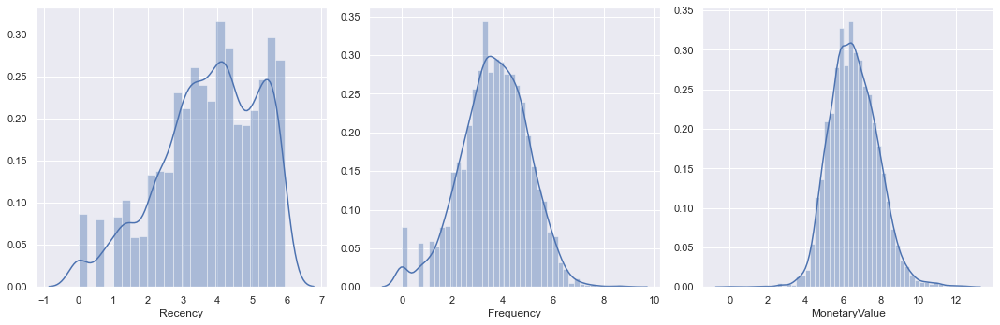

In [48]:
fig, ax = plt.subplots(1,3, figsize=(15,5))
Recency_Plot = Log_Data['Recency']
sns.distplot(Recency_Plot,ax=ax[0])
Frequency_Plot = Log_Data.query('Frequency < 1000')['Frequency']
sns.distplot(Frequency_Plot,ax= ax[1])
Monetary_Plot = Log_Data.query('MonetaryValue < 10000')['MonetaryValue']
sns.distplot(Monetary_Plot,ax=ax[2])
plt.tight_layout()
plt.show()

#### Now to find the K-means clusters we need to scale our data

In [49]:
from sklearn.preprocessing import StandardScaler

#Scaling
scaleobj = StandardScaler()
Scaled_Data = scaleobj.fit_transform(Log_Data)
Scaled_Data = pd.DataFrame(Scaled_Data, index = rfm.index, columns = Log_Data.columns)

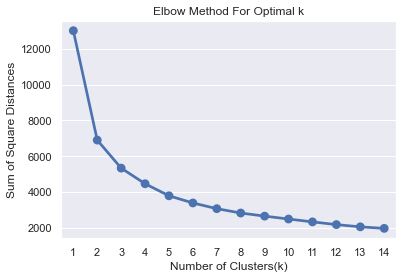

In [50]:
from sklearn.cluster import KMeans

sum_of_sq_dist = {}
for k in range(1,15):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(Scaled_Data)
    sum_of_sq_dist[k] = km.inertia_
    
#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [51]:
#Perform K-means model
clusters = KMeans(n_clusters= 3, init= 'k-means++', max_iter= 1000)
y =clusters.fit(Scaled_Data)

#Find the clusters for the observation given in the dataset
rfm['Cluster'] = clusters.labels_
rfm.head()

,CustomerID,Recency,Frequency,MonetaryValue,R,F,M,rfm_group,rfm_score,RFM_Loyalty_Level,Cluster
0,12346,326,1,77183.60,4,4,1,441,9,Silver,2
1,12347,2,182,4310.00,1,1,1,111,3,Platinum,0
2,12348,75,31,1797.24,3,3,1,331,7,Gold,2
3,12349,19,73,1757.55,2,2,1,221,5,Platinum,2
4,12350,310,17,334.40,4,4,3,443,11,Bronze,1


<Figure size 504x504 with 0 Axes>

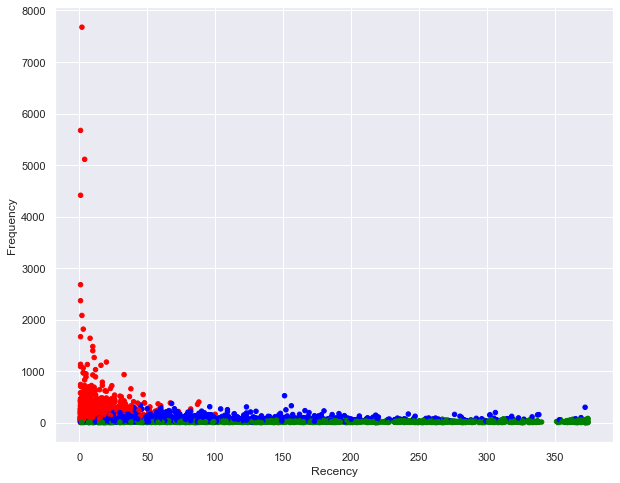

In [52]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["red", "green", "blue"]
rfm['Color'] = rfm['Cluster'].map(lambda p: Colors[p])
ax = rfm.plot(    
    kind="scatter", 
    x="Recency", y="Frequency",
    figsize=(10,8),
    c = rfm['Color']
)

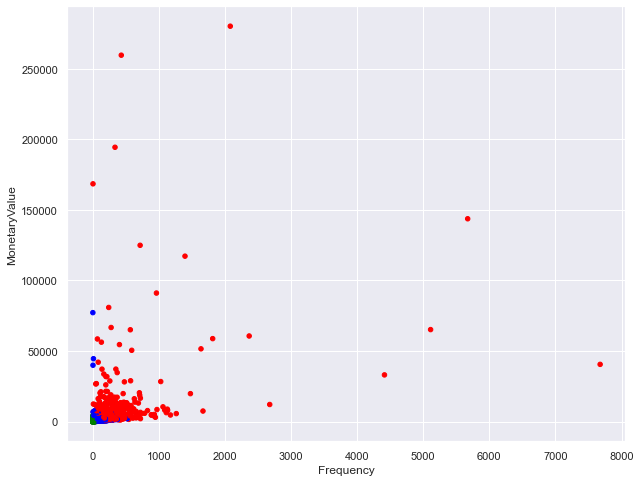

In [53]:
#Scatter Plot Frequency Vs MonetaryValue
Colors = ["red", "green", "blue"]
rfm['Color'] = rfm['Cluster'].map(lambda p: Colors[p])
ax = rfm.plot(    
    kind="scatter", 
    x="Frequency", y="MonetaryValue",
    figsize=(10,8),
    c = rfm['Color']
)

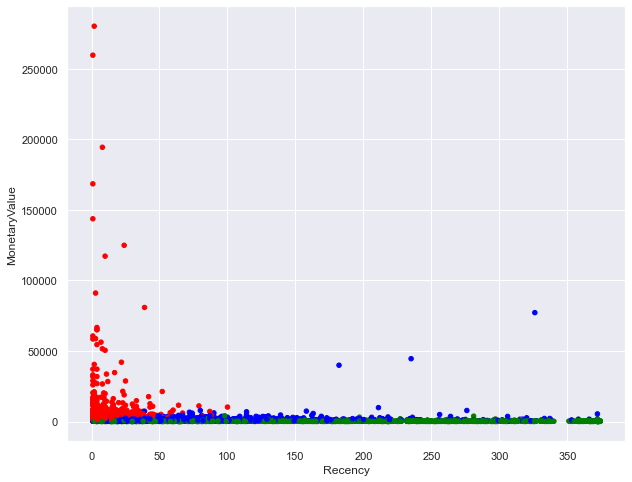

In [54]:
#Scatter Plot Recency Vs MonetaryValue
Colors = ["red", "green", "blue"]
rfm['Color'] = rfm['Cluster'].map(lambda p: Colors[p])
ax = rfm.plot(    
    kind="scatter", 
    x="Recency", y="MonetaryValue",
    figsize=(10,8),
    c = rfm['Color']
)

## Classification Models

In [55]:
model_df = rfm.merge(df, on='CustomerID')
model_df.drop(['InvoiceNo', 'StockCode', 'Description','InvoiceDate',
       'year_month', 'Month', 'Day', 'Hour', 'UnitPrice', 'CustomerID', 'RFM_Loyalty_Level','Country', 'channel','content_no_stop_words','Color'], axis=1, inplace=True)
model_df.columns

Index(['Recency', 'Frequency', 'MonetaryValue', 'R', 'F', 'M', 'rfm_group',
       'rfm_score', 'Cluster', 'Quantity', 'Total_Price'],
      dtype='object')

In [56]:
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix, auc, roc_curve
import warnings

In [57]:
x = model_df.drop(['Cluster'],axis = 1).values
y = model_df.Cluster.values

In [58]:
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn import preprocessing
x_train, x_test, y_train,y_test=train_test_split(x, y, test_size=0.3, random_state=143)

In [59]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(x_train, y_train)
lr_pred_y_train = lr.predict(x_train)

In [60]:
print('Test Accuracy {:.2f}%'.format(lr.score(x_train, y_train)*100))

Test Accuracy 97.37%


In [61]:
lr_pred_y_test = lr.predict(x_test)
print('Test Accuracy {:.2f}%'.format(lr.score(x_test, y_test)*100))

Test Accuracy 97.42%


In [62]:
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

def randomForest(x_train, x_test, y_train, y_test):
    rf = RandomForestClassifier(random_state = 123)
    rf.fit(x_train, y_train)
    
    #Train
    y_train_rf = rf.predict(x_train)
    report_train = pd.DataFrame(metrics.classification_report(y_train, y_train_rf, output_dict=True))
    train_acc = metrics.accuracy_score(y_train, y_train_rf)

    #Test
    y_test_rf = rf.predict(x_test)
    report_test = pd.DataFrame(metrics.classification_report(y_test, y_test_rf, output_dict=True))
    test_acc = metrics.accuracy_score(y_test, y_test_rf)
    
    return train_acc, report_train, test_acc, report_test

In [63]:
train_acc_rf, report_train_rf, test_acc_rf, report_test_rf = randomForest(x_train, x_test, y_train, y_test)
print("Train Accuracy:", train_acc_rf)
report_train_rf

Train Accuracy: 1.0


,0,1,2,accuracy,macro avg,weighted avg
precision,1.0,1.0,1.0,1.0,1.0,1.0
recall,1.0,1.0,1.0,1.0,1.0,1.0
f1-score,1.0,1.0,1.0,1.0,1.0,1.0
support,173731.0,16174.0,85007.0,1.0,274912.0,274912.0


In [64]:
print("Test Accuracy:", test_acc_rf)
report_test_rf

Test Accuracy: 0.9999915124766593


,0,1,2,accuracy,macro avg,weighted avg
precision,0.999987,1.0,1.000000,0.999992,0.999996,0.999992
recall,1.000000,1.0,0.999973,0.999992,0.999991,0.999992
f1-score,0.999993,1.0,0.999986,0.999992,0.999993,0.999992
support,74492.000000,6757.0,36571.000000,0.999992,117820.000000,117820.000000


In [65]:
from sklearn import svm

def svc(X_train, X_test, y_train, y_test):
    SVM = svm.SVC(random_state = 123)
    SVM.fit(X=X_train, y=y_train)
    
    #Train
    y_train_svc = SVM.predict(X=X_train)
    report_train = pd.DataFrame(metrics.classification_report(y_train, y_train_svc, output_dict=True))
    train_acc = metrics.accuracy_score(y_train, y_train_svc)

    #Test
    y_test_svc = SVM.predict(X=X_test)
    report_test = pd.DataFrame(metrics.classification_report(y_test, y_test_svc, output_dict=True))
    test_acc = metrics.accuracy_score(y_test, y_test_svc)
    
    return train_acc, report_train, test_acc, report_test

In [66]:
train_acc_svc, report_train_svc, test_acc_svc, report_test_svc = svc(x_train, x_test, y_train, y_test)
print("Train Accuracy:", train_acc_svc)
report_train_svc

Train Accuracy: 0.9192650739145618


,0,1,2,accuracy,macro avg,weighted avg
precision,0.959088,0.894342,0.846629,0.919265,0.900020,0.920505
recall,0.952795,0.647892,0.902373,0.919265,0.834353,0.919265
f1-score,0.955931,0.751425,0.873613,0.919265,0.860323,0.918445
support,173731.000000,16174.000000,85007.000000,0.919265,274912.000000,274912.000000


In [67]:
print("Test Accuracy:", test_acc_svc)
report_test_svc

Test Accuracy: 0.9198862671872348


,0,1,2,accuracy,macro avg,weighted avg
precision,0.958414,0.895812,0.849513,0.919886,0.901246,0.921021
recall,0.952277,0.661684,0.901616,0.919886,0.838526,0.919886
f1-score,0.955335,0.761151,0.874789,0.919886,0.863759,0.919198
support,74492.000000,6757.000000,36571.000000,0.919886,117820.000000,117820.000000


#### Summary:
##### RFM Analysis

- Majority purchases of high monetary value were made recently
- Low monetary value items were purhcased frequently
- Recency distribution indicates seasonality. This can be confirmed with more data.
- On the basis of RFM scores the customers loyalty level was known.
- There are several outliers in frequency especially with high monetary items. Given more time, would like to assess these outliers separately to understand these customers and purchase patterns.

##### Clustering

- Elbow plot analysis clearly indicated 3 optimal clusters for this dataset. Below are the customer segments:

  - Customers who purchased low monetary products recently 
  - Customers who purchased low monetary products in the past
  - Customers who purchased high monetary products any time

##### Modeling
- Performed Logistic Regression and Random forest. 
- Other models like knn, xgboost, adabosot can be performed. These models take lot of time to run.(The code for these models can be found in appendix part)
- On cluster basis we could predict the behaviour of the customer and we infer that:
  - for cluster 0 customers are frequent, spend more , and they tend to buy the products frequently.
  - for cluster 1 is less frequent, less to spend but the customers buy the products recently.
  - for cluster 2 less to spend the buy the product in old time.
- People falling in cluster 0 could be said loyal customers. And, have high chances to buy the products again.

#### Appendix

import xgboost as xgb

def xgboost_clf(X_train, X_test, y_train, y_test):
    
    xgb_c = xgb.XGBClassifier(seed = 123)
    xgb_c.fit(X=X_train, y=y_train)
    
    #Train
    y_train_xgb_c = xgb_c.predict(X_train)
    report_train = pd.DataFrame(metrics.classification_report(y_train, y_train_xgb_c, output_dict=True))
    train_acc = metrics.accuracy_score(y_train, y_train_xgb_c)

    #Test
    y_test_xgb_c = xgb_c.predict(X_test)
    report_test = pd.DataFrame(metrics.classification_report(y_test, y_test_xgb_c, output_dict=True))
    test_acc = metrics.accuracy_score(y_test, y_test_xgb_c)
    
    return train_acc, report_train, test_acc, report_test

train_acc_xgb, report_train_xgb, test_acc_xgb, report_test_xgb = xgboost_clf(x_train, x_test, y_train, y_test)
print("Train Accuracy:", train_acc_xgb)
report_train_xgb

print("Test Accuracy:", test_acc_xgb)
report_test_xgb

from sklearn.ensemble import AdaBoostClassifier

def ada_clf(X_train, X_test, y_train, y_test):
    ada = Class_Fit(clf = AdaBoostClassifier)
    ada.fit(X = x_train, Y = y_train)



    #Train
    y_train_ada_c = ada.predict(X_train)
    report_train = pd.DataFrame(metrics.classification_report(y_train, y_train_ada_c, output_dict=True))
    train_acc = metrics.accuracy_score(y_train, y_train_ada_c)

    #Test
    y_test_ada_c = ada.predict(X_test)
    report_test = pd.DataFrame(metrics.classification_report(y_test, y_test_ada_c, output_dict=True))
    test_acc = metrics.accuracy_score(y_test, y_test_ada_c)
    
    return train_acc, report_train, test_acc, report_test

train_acc_ada, report_train_ada, test_acc_ada, report_test_ada = ada_clf(x_train, x_test, y_train, y_test)
print("Train Accuracy:", train_acc_ada)
report_train_ada

print("Test Accuracy:", test_acc_ada)
report_test_ada

from sklearn.neighbors import KNeighborsClassifier

def knn_clf(X_train, X_test, y_train, y_test):
    knn = KNeighborsClassifier()
    knn.fit(X=x_train, y=y_train)
    
    #Train
    y_train_knn = knn.predict(X=X_train)
    report_train = pd.DataFrame(metrics.classification_report(y_train, y_train_knn, output_dict=True))
    train_acc = metrics.accuracy_score(y_train, y_train_knn)

    #Test
    y_test_knn = knn.predict(X=X_test)
    report_test = pd.DataFrame(metrics.classification_report(y_test, y_test_knn, output_dict=True))
    test_acc = metrics.accuracy_score(y_test, y_test_knn)
    
    return train_acc, report_train, test_acc, report_test

train_acc_knn, report_train_knn, test_acc_knn, report_test_knn = knn_clf(x_train, x_test, y_train, y_test)
print("Train Accuracy:", train_acc_knn)
report_train_knn

print("Test Accuracy:", test_acc_knn)
report_test_knn